In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import plotly.express as px
%matplotlib inline

In [2]:
import os
import seaborn as sns
df=pd.read_csv("weatherAUS.csv")


In [3]:
df.head()

,Date,Location,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustDir,WindGustSpeed,WindDir9am,...,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,RainToday,RainTomorrow
0,2008-12-01,Albury,13.4,22.9,0.6,NaN,NaN,W,44.0,W,...,71.0,22.0,1007.7,1007.1,8.0,NaN,16.9,21.8,No,No
1,2008-12-02,Albury,7.4,25.1,0.0,NaN,NaN,WNW,44.0,NNW,...,44.0,25.0,1010.6,1007.8,NaN,NaN,17.2,24.3,No,No
2,2008-12-03,Albury,12.9,25.7,0.0,NaN,NaN,WSW,46.0,W,...,38.0,30.0,1007.6,1008.7,NaN,2.0,21.0,23.2,No,No
3,2008-12-04,Albury,9.2,28.0,0.0,NaN,NaN,NE,24.0,SE,...,45.0,16.0,1017.6,1012.8,NaN,NaN,18.1,26.5,No,No
4,2008-12-05,Albury,17.5,32.3,1.0,NaN,NaN,W,41.0,ENE,...,82.0,33.0,1010.8,1006.0,7.0,8.0,17.8,29.7,No,No


In [4]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 145460 entries, 0 to 145459
Data columns (total 23 columns):
 #   Column         Non-Null Count   Dtype  
---  ------         --------------   -----  
 0   Date           145460 non-null  object 
 1   Location       145460 non-null  object 
 2   MinTemp        143975 non-null  float64
 3   MaxTemp        144199 non-null  float64
 4   Rainfall       142199 non-null  float64
 5   Evaporation    82670 non-null   float64
 6   Sunshine       75625 non-null   float64
 7   WindGustDir    135134 non-null  object 
 8   WindGustSpeed  135197 non-null  float64
 9   WindDir9am     134894 non-null  object 
 10  WindDir3pm     141232 non-null  object 
 11  WindSpeed9am   143693 non-null  float64
 12  WindSpeed3pm   142398 non-null  float64
 13  Humidity9am    142806 non-null  float64
 14  Humidity3pm    140953 non-null  float64
 15  Pressure9am    130395 non-null  float64
 16  Pressure3pm    130432 non-null  float64
 17  Cloud9am       89572 non-null

In [5]:
df.dropna(subset=["RainTomorrow","RainToday"],inplace=True)

In [6]:
df.isna().sum()

Date                 0
Location             0
MinTemp            468
MaxTemp            307
Rainfall             0
Evaporation      59694
Sunshine         66805
WindGustDir       9163
WindGustSpeed     9105
WindDir9am        9660
WindDir3pm        3670
WindSpeed9am      1055
WindSpeed3pm      2531
Humidity9am       1517
Humidity3pm       3501
Pressure9am      13743
Pressure3pm      13769
Cloud9am         52625
Cloud3pm         56094
Temp9am            656
Temp3pm           2624
RainToday            0
RainTomorrow         0
dtype: int64

In [7]:
df.columns = [x.lower() for x in df.columns]
df.columns

Index(['date', 'location', 'mintemp', 'maxtemp', 'rainfall', 'evaporation',
       'sunshine', 'windgustdir', 'windgustspeed', 'winddir9am', 'winddir3pm',
       'windspeed9am', 'windspeed3pm', 'humidity9am', 'humidity3pm',
       'pressure9am', 'pressure3pm', 'cloud9am', 'cloud3pm', 'temp9am',
       'temp3pm', 'raintoday', 'raintomorrow'],
      dtype='object')

In [8]:
px.histogram(df,x=df["winddir9am"],color=df["raintomorrow"])

In [9]:
px.histogram(df,x=df["winddir3pm"],color=df["raintomorrow"])

In [10]:
px.histogram(df,x=df["raintoday"],color=df["raintomorrow"])

In [11]:
px.histogram(df,x=df["mintemp"],y=df["maxtemp"],color=df["raintoday"])

C:\Users\HP\AppData\Local\Temp\ipykernel_19208\4084713593.py:4: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.


C:\Users\HP\AppData\Local\Temp\ipykernel_19208\4084713593.py:4: UserWarning:

The palette list has more values (140787) than needed (11), which may not be intended.



<Axes: xlabel='date', ylabel='count'>

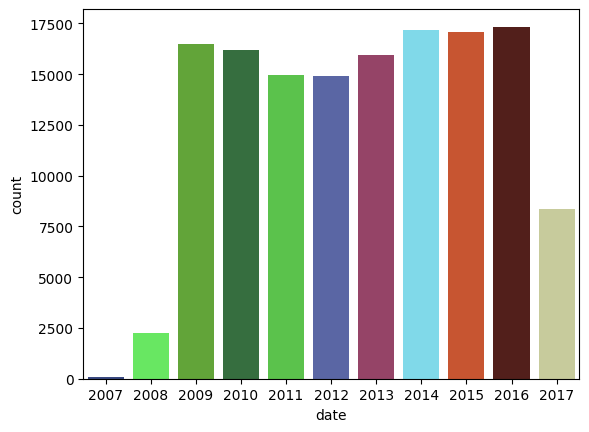

In [12]:
years=pd.to_datetime(df.date).dt.year
num_bars = len(years)
random_colors = [np.random.rand(3,) for _ in range(num_bars)]
sns.countplot(df,x=years,palette=random_colors)

In [13]:
train_df=df[years<2015]
tval_df=df[years==2015]
test_df=df[years>2015]
train_df.shape

(97988, 23)

In [14]:
input_cols=list(train_df.columns[1:-1])
target_col="raintomorrow"

In [15]:
train_inputs=train_df[input_cols].copy()
train_targets=train_df[target_col].copy()


In [16]:
val_inputs=tval_df[input_cols].copy()
val_targets=tval_df[target_col].copy()
test_inputs=test_df[input_cols].copy()
test_targets=test_df[target_col].copy()


In [17]:
train_inputs

,location,mintemp,maxtemp,rainfall,evaporation,sunshine,windgustdir,windgustspeed,winddir9am,winddir3pm,...,windspeed3pm,humidity9am,humidity3pm,pressure9am,pressure3pm,cloud9am,cloud3pm,temp9am,temp3pm,raintoday
0,Albury,13.4,22.9,0.6,NaN,NaN,W,44.0,W,WNW,...,24.0,71.0,22.0,1007.7,1007.1,8.0,NaN,16.9,21.8,No
1,Albury,7.4,25.1,0.0,NaN,NaN,WNW,44.0,NNW,WSW,...,22.0,44.0,25.0,1010.6,1007.8,NaN,NaN,17.2,24.3,No
2,Albury,12.9,25.7,0.0,NaN,NaN,WSW,46.0,W,WSW,...,26.0,38.0,30.0,1007.6,1008.7,NaN,2.0,21.0,23.2,No
3,Albury,9.2,28.0,0.0,NaN,NaN,NE,24.0,SE,E,...,9.0,45.0,16.0,1017.6,1012.8,NaN,NaN,18.1,26.5,No
4,Albury,17.5,32.3,1.0,NaN,NaN,W,41.0,ENE,NW,...,20.0,82.0,33.0,1010.8,1006.0,7.0,8.0,17.8,29.7,No
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
144548,Uluru,16.9,33.2,0.0,NaN,NaN,SSE,43.0,ESE,SSE,...,26.0,22.0,13.0,1014.1,1009.8,NaN,NaN,23.7,31.8,No
144549,Uluru,15.1,36.8,0.0,NaN,NaN,NE,31.0,ENE,SW,...,20.0,16.0,8.0,1012.6,1007.6,NaN,NaN,28.9,34.8,No
144550,Uluru,17.3,37.8,0.0,NaN,NaN,ESE,39.0,ESE,SSE,...,9.0,15.0,8.0,1011.9,1008.0,NaN,NaN,29.7,35.7,No
144551,Uluru,20.1,38.5,0.0,NaN,NaN,ESE,43.0,ESE,SSW,...,17.0,22.0,9.0,1014.0,1009.2,NaN,NaN,29.8,37.2,No


In [18]:
numeric_cols=train_inputs.select_dtypes(include=np.number).columns.tolist()
cat_cols=train_inputs.select_dtypes(include=object).columns.tolist()


In [19]:
from sklearn.impute import SimpleImputer
imputer=SimpleImputer(strategy="mean").fit(df[numeric_cols])
train_inputs[numeric_cols]=imputer.transform(train_inputs[numeric_cols])
val_inputs[numeric_cols]=imputer.transform(val_inputs[numeric_cols])
test_inputs[numeric_cols]=imputer.transform(test_inputs[numeric_cols])


In [20]:
from sklearn.preprocessing import MinMaxScaler
scaler=MinMaxScaler().fit(df[numeric_cols])


In [21]:
train_inputs[numeric_cols]=scaler.transform(train_inputs[numeric_cols])
val_inputs[numeric_cols]=scaler.transform(val_inputs[numeric_cols])
test_inputs[numeric_cols]=scaler.transform(test_inputs[numeric_cols])

In [22]:
train_inputs["windgustdir"]=train_inputs["windgustdir"].fillna('unknown')
train_inputs["winddir9am"]=train_inputs["winddir9am"].fillna('unknown')

train_inputs["winddir3pm"]=train_inputs["winddir3pm"].fillna('unknown')




In [23]:
val_inputs["windgustdir"]=val_inputs["windgustdir"].fillna('unknown')
val_inputs["winddir9am"]=val_inputs["winddir9am"].fillna('unknown')

val_inputs["winddir3pm"]=val_inputs["winddir3pm"].fillna('unknown')

test_inputs["windgustdir"]=test_inputs["windgustdir"].fillna('unknown')
test_inputs["winddir9am"]=test_inputs["winddir9am"].fillna('unknown')

test_inputs["winddir3pm"]=test_inputs["winddir3pm"].fillna('unknown')

In [24]:
test_inputs.isna().sum()

location         0
mintemp          0
maxtemp          0
rainfall         0
evaporation      0
sunshine         0
windgustdir      0
windgustspeed    0
winddir9am       0
winddir3pm       0
windspeed9am     0
windspeed3pm     0
humidity9am      0
humidity3pm      0
pressure9am      0
pressure3pm      0
cloud9am         0
cloud3pm         0
temp9am          0
temp3pm          0
raintoday        0
dtype: int64

In [25]:
from sklearn.preprocessing import OneHotEncoder
encoder=OneHotEncoder(sparse_output=False,handle_unknown="ignore").fit(train_inputs[cat_cols])

In [26]:
encodedd_cols=list(encoder.get_feature_names_out(cat_cols))
train_inputs[encodedd_cols]=encoder.transform(train_inputs[cat_cols])

C:\Users\HP\AppData\Local\Temp\ipykernel_19208\4009434859.py:2: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\HP\AppData\Local\Temp\ipykernel_19208\4009434859.py:2: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\HP\AppData\Local\Temp\ipykernel_19208\4009434859.py:2: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, us

In [27]:

test_inputs[encodedd_cols]=encoder.transform(test_inputs[cat_cols])

val_inputs[encodedd_cols]=encoder.transform(val_inputs[cat_cols])

C:\Users\HP\AppData\Local\Temp\ipykernel_19208\2435114239.py:1: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\HP\AppData\Local\Temp\ipykernel_19208\2435114239.py:1: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\HP\AppData\Local\Temp\ipykernel_19208\2435114239.py:1: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, us

In [28]:
print(train_inputs.columns.to_list)

<bound method IndexOpsMixin.tolist of Index(['location', 'mintemp', 'maxtemp', 'rainfall', 'evaporation', 'sunshine',
       'windgustdir', 'windgustspeed', 'winddir9am', 'winddir3pm',
       ...
       'winddir3pm_SE', 'winddir3pm_SSE', 'winddir3pm_SSW', 'winddir3pm_SW',
       'winddir3pm_W', 'winddir3pm_WNW', 'winddir3pm_WSW',
       'winddir3pm_unknown', 'raintoday_No', 'raintoday_Yes'],
      dtype='object', length=123)>


In [29]:
train_inputs.drop(columns=["location","windgustdir","winddir9am","winddir3pm","raintoday"],inplace=True)

In [30]:
test_inputs.drop(columns=["location","windgustdir","winddir9am","winddir3pm","raintoday"],inplace=True)
val_inputs.drop(columns=["location","windgustdir","winddir9am","winddir3pm","raintoday"],inplace=True)


In [31]:
print(test_inputs.info())

<class 'pandas.core.frame.DataFrame'>
Index: 25710 entries, 2498 to 145458
Columns: 118 entries, mintemp to raintoday_Yes
dtypes: float64(118)
memory usage: 23.3 MB
None


In [32]:
test_inputs.isna().sum()

mintemp               0
maxtemp               0
rainfall              0
evaporation           0
sunshine              0
                     ..
winddir3pm_WNW        0
winddir3pm_WSW        0
winddir3pm_unknown    0
raintoday_No          0
raintoday_Yes         0
Length: 118, dtype: int64

In [33]:
train_targets

0         No
1         No
2         No
3         No
4         No
          ..
144548    No
144549    No
144550    No
144551    No
144552    No
Name: raintomorrow, Length: 97988, dtype: object

In [34]:
from sklearn.tree import DecisionTreeClassifier
model=DecisionTreeClassifier(random_state=42)
model.fit(train_inputs,train_targets)

DecisionTreeClassifier(random_state=42)

In [35]:
from sklearn.metrics import accuracy_score,confusion_matrix

In [36]:
train_preds=model.predict(train_inputs)

In [37]:
train_preds

array(['No', 'No', 'No', ..., 'No', 'No', 'No'], dtype=object)

In [38]:
test_targets

2498       No
2499      Yes
2500      Yes
2501      Yes
2502       No
         ... 
145454     No
145455     No
145456     No
145457     No
145458     No
Name: raintomorrow, Length: 25710, dtype: object

In [39]:
accuracy_score(train_targets,train_preds)

0.9999795893374699

In [40]:
pd.value_counts(train_preds)

C:\Users\HP\AppData\Local\Temp\ipykernel_19208\1258350197.py:1: FutureWarning:

pandas.value_counts is deprecated and will be removed in a future version. Use pd.Series(obj).value_counts() instead.



No     76192
Yes    21796
Name: count, dtype: int64

In [41]:
confusion_matrix(train_targets,train_preds)

array([[76190,     0],
       [    2, 21796]], dtype=int64)

In [42]:
train_probabs = model.predict_proba(train_inputs)

In [43]:
train_probabs

array([[1., 0.],
       [1., 0.],
       [1., 0.],
       ...,
       [1., 0.],
       [1., 0.],
       [1., 0.]])

In [44]:
model.score(val_inputs,val_targets)

0.7936684416876353

In [45]:
val_targtes.value_counts()/len(val_targtes)

NameError: name 'val_targtes' is not defined

[Text(0.5, 0.875, 'humidity3pm <= 0.715\ngini = 0.346\nsamples = 97988\nvalue = [76190, 21798]'),
 Text(0.25, 0.625, 'humidity3pm <= 0.512\ngini = 0.244\nsamples = 81588\nvalue = [69975, 11613]'),
 Text(0.375, 0.75, 'True  '),
 Text(0.125, 0.375, 'sunshine <= 0.525\ngini = 0.142\nsamples = 47657\nvalue = [43985.0, 3672.0]'),
 Text(0.0625, 0.125, '\n  (...)  \n'),
 Text(0.1875, 0.125, '\n  (...)  \n'),
 Text(0.375, 0.375, 'windgustspeed <= 0.333\ngini = 0.359\nsamples = 33931\nvalue = [25990, 7941]'),
 Text(0.3125, 0.125, '\n  (...)  \n'),
 Text(0.4375, 0.125, '\n  (...)  \n'),
 Text(0.75, 0.625, 'humidity3pm <= 0.825\ngini = 0.471\nsamples = 16400\nvalue = [6215, 10185]'),
 Text(0.625, 0.75, '  False'),
 Text(0.625, 0.375, 'rainfall <= 0.007\ngini = 0.499\nsamples = 9053\nvalue = [4772, 4281]'),
 Text(0.5625, 0.125, '\n  (...)  \n'),
 Text(0.6875, 0.125, '\n  (...)  \n'),
 Text(0.875, 0.375, 'rainfall <= 0.009\ngini = 0.316\nsamples = 7347\nvalue = [1443, 5904]'),
 Text(0.8125, 0.125, 

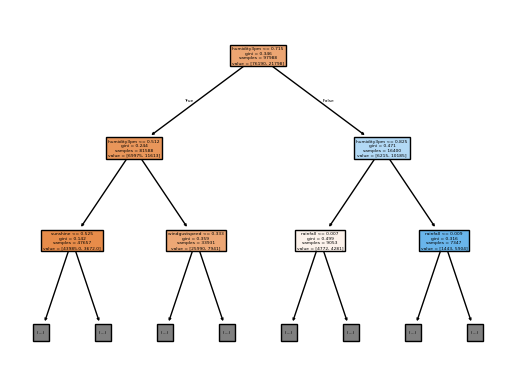

In [ ]:
from sklearn.tree import plot_tree,export_text
plt.Figure(figsize=(80,20))
plot_tree(model,feature_names=train_inputs.columns,max_depth=2,filled=True)

In [ ]:
imp_featu=pd.DataFrame({'feature':train_inputs.columns,'importance':model.feature_importances_}).sort_values('importance',ascending=False)

In [ ]:
model=DecisionTreeClassifier(max_depth=8,random_state=42)
model.fit(train_inputs,train_targets)


DecisionTreeClassifier(max_depth=8, random_state=42)

In [ ]:
model.score(train_inputs,train_targets)

0.8551863493488998

In [ ]:
model.score(val_inputs,val_targets)

0.8461583474749839

[Text(0.5, 0.875, 'humidity3pm <= 0.715\ngini = 0.346\nsamples = 97988\nvalue = [76190, 21798]'),
 Text(0.25, 0.625, 'humidity3pm <= 0.512\ngini = 0.244\nsamples = 81588\nvalue = [69975, 11613]'),
 Text(0.375, 0.75, 'True  '),
 Text(0.125, 0.375, 'sunshine <= 0.525\ngini = 0.142\nsamples = 47657\nvalue = [43985.0, 3672.0]'),
 Text(0.0625, 0.125, '\n  (...)  \n'),
 Text(0.1875, 0.125, '\n  (...)  \n'),
 Text(0.375, 0.375, 'windgustspeed <= 0.333\ngini = 0.359\nsamples = 33931\nvalue = [25990, 7941]'),
 Text(0.3125, 0.125, '\n  (...)  \n'),
 Text(0.4375, 0.125, '\n  (...)  \n'),
 Text(0.75, 0.625, 'humidity3pm <= 0.825\ngini = 0.471\nsamples = 16400\nvalue = [6215, 10185]'),
 Text(0.625, 0.75, '  False'),
 Text(0.625, 0.375, 'rainfall <= 0.007\ngini = 0.499\nsamples = 9053\nvalue = [4772, 4281]'),
 Text(0.5625, 0.125, '\n  (...)  \n'),
 Text(0.6875, 0.125, '\n  (...)  \n'),
 Text(0.875, 0.375, 'rainfall <= 0.009\ngini = 0.316\nsamples = 7347\nvalue = [1443, 5904]'),
 Text(0.8125, 0.125, 

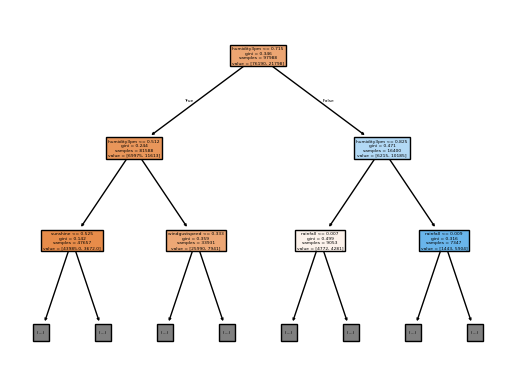

In [ ]:
plt.Figure(figsize=(80,20))
plot_tree(model,feature_names=train_inputs.columns,max_depth=2,filled=True)

In [46]:
model=DecisionTreeClassifier(max_leaf_nodes=256,random_state=42)
model.fit(train_inputs,train_targets)

DecisionTreeClassifier(max_leaf_nodes=256, random_state=42)

In [47]:
model.score(train_inputs,train_targets)

0.859850185737029

In [48]:
model.score(val_inputs,val_targets)

0.8473286909707999

In [49]:
from sklearn.ensemble import RandomForestClassifier
model=RandomForestClassifier(n_jobs=-1,random_state=42)
model.fit(train_inputs,train_targets)

RandomForestClassifier(n_jobs=-1, random_state=42)

In [50]:
model.score(train_inputs,train_targets)

0.9999693840062048

In [51]:
model.score(val_inputs,val_targets)

0.8567499561121189

In [52]:
basemodel=RandomForestClassifier(random_state=42,n_jobs=-1).fit(train_inputs,train_targets)

In [53]:
basemodel.score(train_inputs,train_targets)
basemodel.score(val_inputs,val_targets)


0.8567499561121189

n_estimators -> controls the number of decision trees in the random forest


In [54]:
basemodel=RandomForestClassifier(random_state=42,n_jobs=-1,n_estimators=100).fit(train_inputs,train_targets)


In [55]:
basemodel.score(train_inputs,train_targets)

0.9999693840062048

In [56]:
basemodel.score(train_inputs,train_targets)
basemodel.score(val_inputs,val_targets)


0.8567499561121189

In [57]:
def try_params(**params):
    model=RandomForestClassifier(random_state=42,n_jobs=-1,**params).fit(train_inputs,train_targets)
    return model.score(train_inputs,train_targets),model.score(val_inputs,val_targets)

In [58]:
try_params(max_depth=29,max_leaf_nodes=2**14)

(0.9917642976691023, 0.8571010591608638)

In [59]:

try_params(max_features=.33)


(0.9999693840062048, 0.8578032652583534)

In [60]:
try_params(min_samples_split=30,min_samples_leaf=2,class_weight="balanced")


(0.9069784055190432, 0.8439932120077243)

In [61]:
try_params(class_weight={'No':1,'Yes':2})



(0.9999693840062048, 0.8557551641406753)